# Stream Plots
This notebook contains the following plots:
- CM4 historical experiment stream plot
- CM4 SSP585 experiment stream plot
- ESM4 historical experiment stream plot
- ESM4 SSP585 experiment stream plot
- CM4X historical experiment stream plot
- CM4X SSP585 experiment stream plot
- ERA5 stream plot

Some reminders:
- meridional components refer to north and south directions *(VAS)*
- zonal components refer to east and west directions *(UAS)*

This code was produced by Grace Woolslayer. Contact grace.woolslayer@temple.edu for questions.

---

## importing all necessary packages and functions for analysis

In [1]:
import matplotlib.pyplot as plt 
import matplotlib.patches as mpatches
import numpy as np
import xarray as xr ## xarray to make most of the plots
%matplotlib inline
%config InlineBackend.figure_format='retina'
import cmocean ## for colors on plots
import cartopy.crs as ccrs
import matplotlib.path as mpath
import nc_time_axis
import pandas as pd
import zarr ## for google cloud load in
import gcsfs
import matplotlib.path as mpath

In [2]:
##importing south polar projection. ## This function was provided by Dr. Beadling in Climate Modeling course.
def South_Polar(array,vmin,vmax,cmap):
    subplot_kws = dict(projection=ccrs.SouthPolarStereo()) 
    fig, ax = plt.subplots(figsize=[10, 5],subplot_kw=subplot_kws)
    
    array.plot.contourf(ax=ax,
               transform =ccrs.PlateCarree(),
               vmin=vmin,
               vmax=vmax,
               extend='both',
               cmap=cmap, levels=45)

    # Limit the map to -50 degrees latitude and below.
    ax.set_extent([-180, 180, -90, -55], ccrs.PlateCarree())
    
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)

    ax.set_boundary(circle, transform=ax.transAxes)
    ax.coastlines()

# How we can calculate wind speed from u and v component of wind:

![](https://sgichuki.github.io/Atmo/windspeed-diagram.png)

"The wind components are eastward and northward wind vectors that are represented by the variables “U” and “V” respectively. The U wind component is parallel to the x-axis (i.e. longitude). A positive U wind comes from the west, and a negative U wind comes from the east. The V wind component is parallel to the y- axis (i.e. latitude). A positive V wind comes from the south, and a negative V wind comes from the north. The MERRA-2 variable names typically contain "eastward wind" or "northward wind" at a given height or pressure level" ([Ostrenga](https://disc.gsfc.nasa.gov/information/data-in-action?title=Derive%20Wind%20Speed%20and%20Direction%20With%20MERRA-2%20Wind%20Components)).

---

# CM4

## <span style="color:blue">CM4 Historical</span>

### uas wind component

In [3]:
##importing Eastward Near-Surface Wind data from google cloud. Amon
df_uas_historical = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
	
# step two … # replace with the id you need and other info to ween down datasets 
df_u_historical = df_uas_historical.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'uas'& table_id == 'Amon'")

# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_u_historical.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_uas_historical_use = xr.open_zarr(mapper, consolidated=True)

#extracting uas variable
cm4_uas_historical = ds_uas_historical_use.uas 
cm4_uas_historical

<xarray.DataArray 'uas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1980, 180, 288), dtype=float32, chunksize=(305, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [4]:
##importing Northward Near-Surface Wind data from google cloud.
df_vas_historical = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
	
# step two … # replace with the id you need and other info to ween down datasets 
df_v_historical = df_vas_historical.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'vas'& table_id == 'Amon'")

# step three 
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_v_historical.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_vas_historical = xr.open_zarr(mapper, consolidated=True)

cm4_vas_historical=ds_vas_historical.vas
cm4_vas_historical

<xarray.DataArray 'vas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1980, 180, 288), dtype=float32, chunksize=(298, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [5]:
#isolating a 20 year time period 
cm4_uas_his_time_slice=cm4_uas_historical.sel(time=slice('1995-01-16','2014-12-16'))
cm4_uas_his_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(150, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [6]:
#isolating a 20 year time period 
cm4_vas_his_time_slice=cm4_vas_historical.sel(time=slice('1995-01-16','2014-12-16'))
cm4_vas_his_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(192, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [7]:
cm4_his_mergewinds = xr.merge([cm4_uas_his_time_slice,cm4_vas_his_time_slice]) # merge winds to get a single wind speed
cm4_his_xmerge = cm4_his_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
cm4_his_ymerge = cm4_his_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
cm4_his_umerge = cm4_his_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
cm4_his_vmerge = cm4_his_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot

## position
cm4_his_position = cm4_his_mergewinds.mean(dim='time')


### CM4 Historical Orography

In [8]:
d_orog = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_cm4 = d_orog.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_cm4.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_orog_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


cm4_orog = cm4_orog_open.orog #extracting orography
cm4_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### creating stream plot

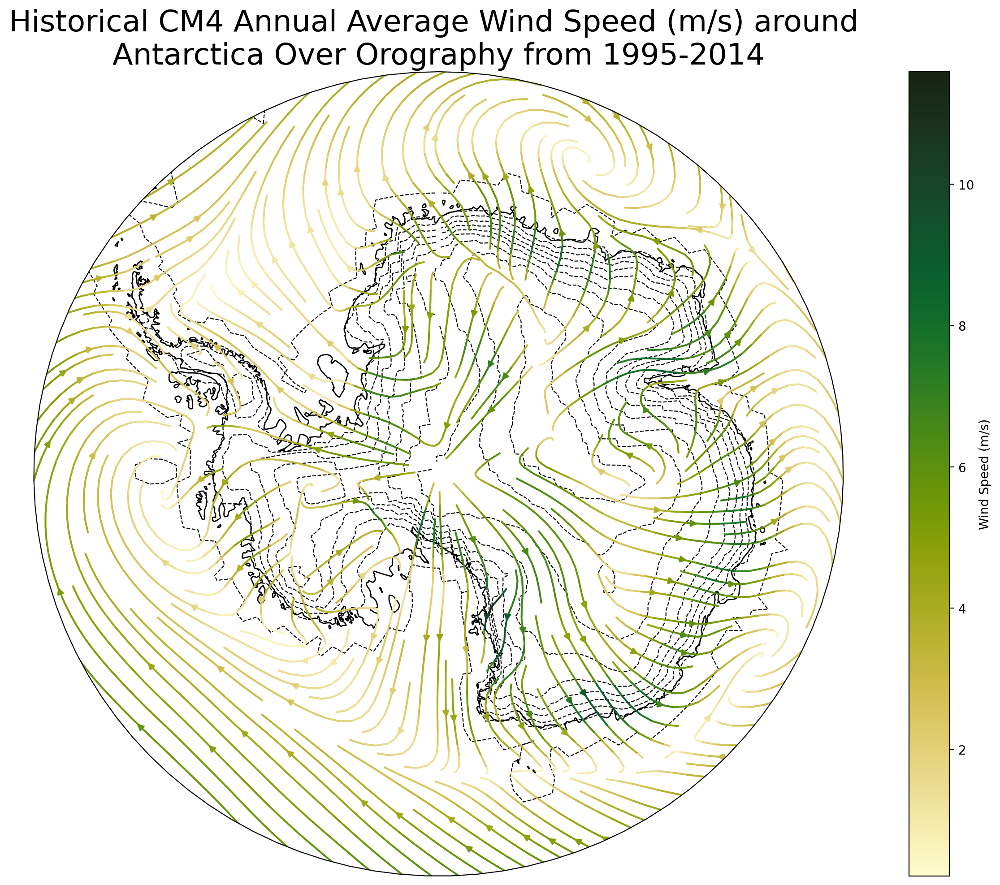

In [9]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Plotting contour of orography
cm4_orog.plot.contour(ax=ax,
                                transform=ccrs.PlateCarree(),
                                vmin=0,
                                vmax=3600,
                                extend='both',
                                colors='k',
                                levels=10,
                                linewidths=0.8,
                                linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = cm4_his_position['lon'].values
lat = cm4_his_position['lat'].values
uas = cm4_his_position['uas'].values
vas = cm4_his_position['vas'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('Historical CM4 Annual Average Wind Speed (m/s) around \nAntarctica Over Orography from 1995-2014', fontsize=24,loc='center')
plt.tight_layout()
plt.show()

--- 

## <span style="color:blue">CM4 SSP585</span>

### uas wind component

In [10]:
##importing Eastward Near-Surface Wind data from google cloud. Amon
df_uas_cm4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')	
# step two … # replace with the id you need and other info to ween down datasets 
df_u_cm4_ssp = df_uas_cm4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'uas'& table_id == 'Amon'")
# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_u_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_uas_ssp_open = xr.open_zarr(mapper, consolidated=True)

cm4_uas_ssp=cm4_uas_ssp_open.uas
cm4_uas_ssp

<xarray.DataArray 'uas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1032, 180, 288), dtype=float32, chunksize=(612, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [11]:
##importing northward Near-Surface Wind data from google cloud. Amon
df_vas_cm4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')

# step two … # replace with the id you need and other info to ween down datasets 
df_v_cm4_ssp =df_vas_cm4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'vas'& table_id == 'Amon'")

# step three - loading in the data and storing it
gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_v_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
ds_vas_cm4_ssp = xr.open_zarr(mapper, consolidated=True)

cm4_vas_ssp=ds_vas_cm4_ssp.vas
cm4_vas_ssp

<xarray.DataArray 'vas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1032, 180, 288), dtype=float32, chunksize=(597, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [12]:
#isolating a 20 year time period 
cm4_uas_ssp_time_slice=cm4_uas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
cm4_uas_ssp_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [13]:
#isolating a 20 year time period 
cm4_vas_ssp_time_slice=cm4_vas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
cm4_vas_ssp_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [14]:
cm4_ssp_mergewinds = xr.merge([cm4_uas_ssp_time_slice,cm4_vas_ssp_time_slice]) # merge winds to get a single wind speed
cm4_ssp_xmerge = cm4_ssp_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
cm4_ssp_ymerge = cm4_ssp_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
cm4_ssp_umerge = cm4_ssp_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
cm4_ssp_vmerge = cm4_ssp_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot

## position
cm4_ssp_position = cm4_ssp_mergewinds.mean(dim='time')

### CM4 SSP585 Orography Data

In [15]:
d_orog_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_cm4_ssp = d_orog_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_cm4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
cm4_orog_ssp_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


cm4_ssp585_orog = cm4_orog_ssp_open.orog #extracting orography
cm4_ssp585_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### creating stream plots

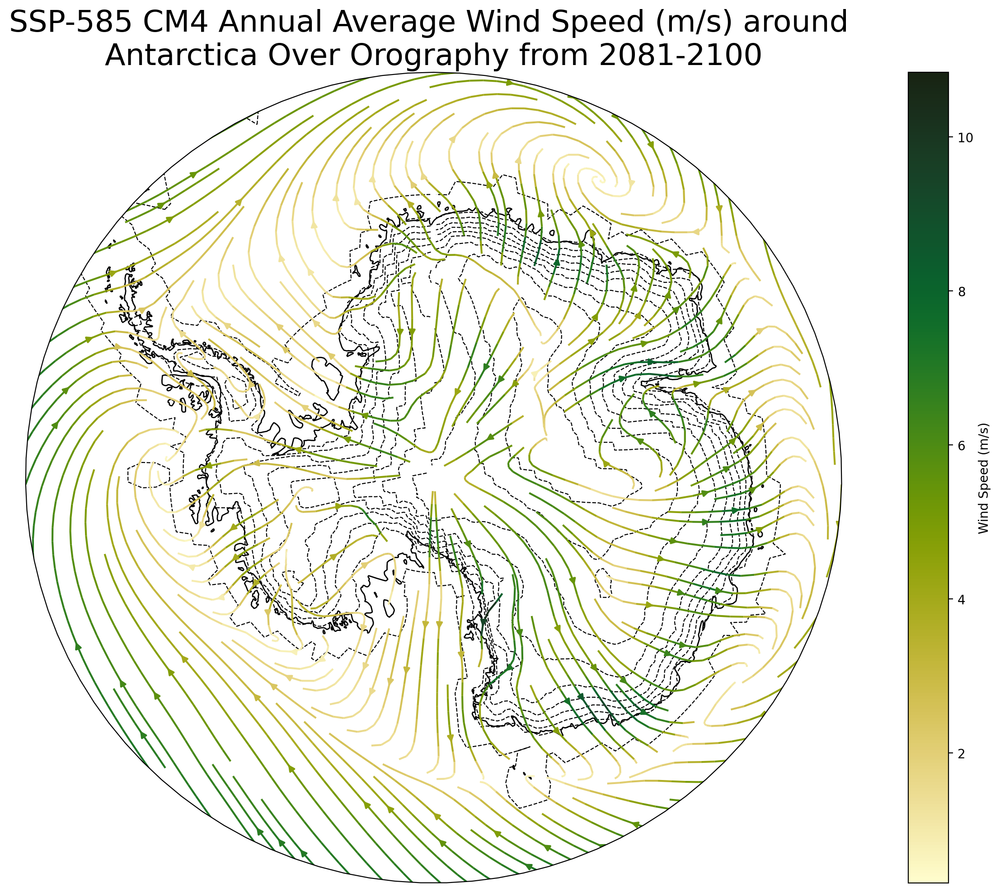

In [51]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Plotting contour of orography
cm4_ssp585_orog.plot.contour(ax=ax,
                                transform=ccrs.PlateCarree(),
                                vmin=0,
                                vmax=3600,
                                extend='both',
                                colors='k',
                                levels=10,
                                linewidths=0.8,
                                linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = cm4_ssp_position['lon'].values
lat = cm4_ssp_position['lat'].values
uas = cm4_ssp_position['uas'].values
vas = cm4_ssp_position['vas'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('SSP-585 CM4 Annual Average Wind Speed (m/s) around \nAntarctica Over Orography from 2081-2100', fontsize=24)
plt.tight_layout()
plt.show()

---

# ESM4

## <span style="color:red">ESM4 Historical</span>

### uas wind component

In [17]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_uas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'uas' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_uas = gfdl_esm4_uas_data.zstore.values[-1]
mapper_esm4_uas = gcs.get_mapper(zstore_esm4_uas)

esm4_uas = xr.open_zarr(mapper_esm4_uas, 
                                consolidated=True,use_cftime=True)
esm4_uas_historical=esm4_uas.uas #extracting the uas variable
esm4_uas_historical

<xarray.DataArray 'uas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1980, 180, 288), dtype=float32, chunksize=(611, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [18]:
#defines the NorthWard Near-Surface Wind
gfdl_esm4_vas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'vas' & \
    experiment_id == 'historical' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

zstore_esm4_vas = gfdl_esm4_vas_data.zstore.values[-1]
mapper_esm4_vas = gcs.get_mapper(zstore_esm4_vas)

esm4_vas = xr.open_zarr(mapper_esm4_vas, 
                                consolidated=True,use_cftime=True)
esm4_vas_historical=esm4_vas.vas
esm4_vas_historical

<xarray.DataArray 'vas' (time: 1980, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1980, 180, 288), dtype=float32, chunksize=(596, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [19]:
#isolating a 20 year time period 
esm4_uas_his_time_slice=esm4_uas_historical.sel(time=slice('1995-01-16','2014-12-16'))
esm4_uas_his_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(147, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [20]:
#isolating a 20 year time period 
esm4_vas_his_time_slice=esm4_vas_historical.sel(time=slice('1995-01-16','2014-12-16'))
esm4_vas_his_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(192, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [21]:
esm4_his_mergewinds = xr.merge([esm4_uas_his_time_slice,esm4_vas_his_time_slice]) # merge winds to get a single wind speed
esm4_his_xmerge = esm4_his_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
esm4_his_ymerge = esm4_his_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
esm4_his_umerge = esm4_his_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
esm4_his_vmerge = esm4_his_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot

## position
esm4_his_position = esm4_his_mergewinds.mean(dim='time')

### ESM4 Historical Orography

In [22]:
d_orog_e4_his = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_e4_his = d_orog_e4_his.query("source_id=='GFDL-CM4' & experiment_id == 'historical' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_e4_his.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
e4_orog_his_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


esm4_his_orog = e4_orog_his_open.orog #extracting orography
esm4_his_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### creating stream plot

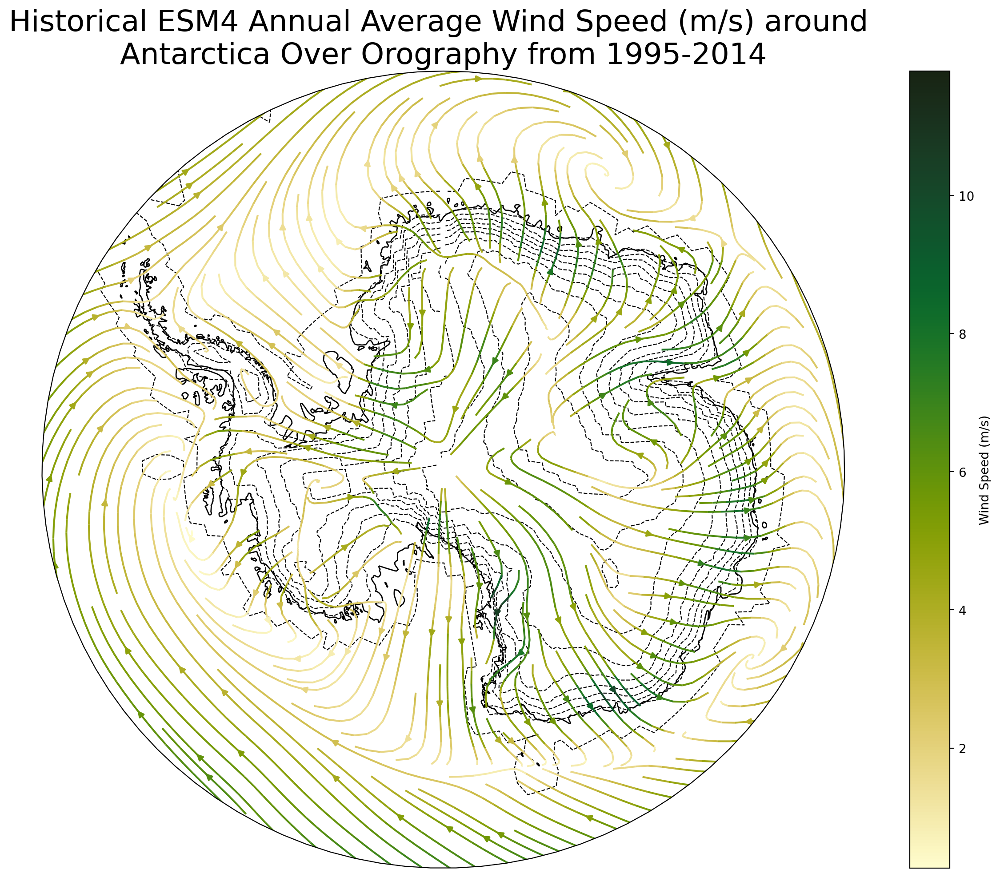

In [23]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Plotting contour of orography
esm4_his_orog.plot.contour(ax=ax,
                                transform=ccrs.PlateCarree(),
                                vmin=0,
                                vmax=3600,
                                extend='both',
                                colors='k',
                                levels=10,
                                linewidths=0.8,
                                linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = esm4_his_position['lon'].values
lat = esm4_his_position['lat'].values
uas = esm4_his_position['uas'].values
vas = esm4_his_position['vas'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('Historical ESM4 Annual Average Wind Speed (m/s) around \nAntarctica Over Orography from 1995-2014', fontsize=24)
plt.tight_layout()
plt.show()

---

## <span style="color:red">ESM4 SSP585</span>

### uas wind component

In [24]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_uas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'uas' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_uas = gfdl_esm4_uas_data.zstore.values[-1]
mapper_esm4_uas = gcs.get_mapper(zstore_esm4_uas)

esm4_uas = xr.open_zarr(mapper_esm4_uas, 
                                consolidated=True,use_cftime=True)
esm4_uas_ssp=esm4_uas.uas #extracting the uas variable
esm4_uas_ssp

<xarray.DataArray 'uas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-uas, shape=(1032, 180, 288), dtype=float32, chunksize=(613, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

### vas wind component

In [25]:
esm4 = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
#defines the Eastward Near-Surface Wind
gfdl_esm4_vas_data = esm4.query(
    "table_id == 'Amon' & \
    variable_id == 'vas' & \
    experiment_id == 'ssp585' & \
    institution_id == 'NOAA-GFDL' &  \
    source_id == 'GFDL-ESM4'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore_esm4_vas = gfdl_esm4_vas_data.zstore.values[-1]
mapper_esm4_vas = gcs.get_mapper(zstore_esm4_vas)

esm4_vas = xr.open_zarr(mapper_esm4_vas, 
                                consolidated=True,use_cftime=True)
esm4_vas_ssp=esm4_vas.vas #extracting the vas variable
esm4_vas_ssp

<xarray.DataArray 'vas' (time: 1032, lat: 180, lon: 288)>
dask.array<open_dataset-vas, shape=(1032, 180, 288), dtype=float32, chunksize=(596, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

### merging winds

In [26]:
#isolating a 20 year time period 
esm4_uas_ssp_time_slice=esm4_uas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
esm4_uas_ssp_time_slice

<xarray.DataArray 'uas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Eastward Near-Surface Wind
    original_name:  uas
    standard_name:  eastward_wind
    units:          m s-1

In [27]:
#isolating a 20 year time period 
esm4_vas_ssp_time_slice=esm4_vas_ssp.sel(time=slice('2081-01-16','2100-12-16'))
esm4_vas_ssp_time_slice

<xarray.DataArray 'vas' (time: 240, lat: 180, lon: 288)>
dask.array<getitem, shape=(240, 180, 288), dtype=float32, chunksize=(240, 180, 288), chunktype=numpy.ndarray>
Coordinates:
    height   float64 ...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
  * time     (time) object 2081-01-16 12:00:00 ... 2100-12-16 12:00:00
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: time: mean
    interp_method:  conserve_order2
    long_name:      Northward Near-Surface Wind
    original_name:  vas
    standard_name:  northward_wind
    units:          m s-1

In [28]:
esm4_ssp_mergewinds = xr.merge([esm4_uas_ssp_time_slice,esm4_vas_ssp_time_slice]) # merge winds to get a single wind speed
esm4_ssp_xmerge = esm4_ssp_mergewinds.lon #extracting the longitude component from the mergewinds array to get position for the quiver plot
esm4_ssp_ymerge = esm4_ssp_mergewinds.lat #extracting the latitude component from the mergewinds array to get position for the quiver plot
esm4_ssp_umerge = esm4_ssp_mergewinds.uas #extracting uas component to get the magnitude of vector for quiver plot
esm4_ssp_vmerge = esm4_ssp_mergewinds.vas #extracting vas component to get the magnitude of vector for quiver plot

## position
esm4_ssp_position = esm4_ssp_mergewinds.mean(dim='time')

### ESM4 SSP585 Orography

In [14]:
d_orog_e4_ssp = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') # importing google data
df_orog_e4_ssp = d_orog_e4_ssp.query("source_id=='GFDL-CM4' & experiment_id == 'ssp585' & variable_id == 'orog' & grid_label=='gr1'")

gcs = gcsfs.GCSFileSystem(token='anon')
zstore = df_orog_e4_ssp.zstore.values[-1]
mapper = gcs.get_mapper(zstore)
e4_orog_ssp_open = xr.open_zarr(mapper, consolidated=True) #isolated dataset


esm4_ssp_orog = e4_orog_ssp_open.orog #extracting orography
esm4_ssp_orog

<xarray.DataArray 'orog' (lat: 180, lon: 288)>
dask.array<open_dataset-orog, shape=(180, 288), dtype=float32, chunksize=(180, 288), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.625 1.875 3.125 4.375 ... 355.6 356.9 358.1 359.4
Attributes:
    cell_measures:  area: areacella
    cell_methods:   area: mean
    interp_method:  conserve_order1
    long_name:      Surface Altitude
    original_name:  orog
    standard_name:  surface_altitude
    units:          m

### creating stream plot

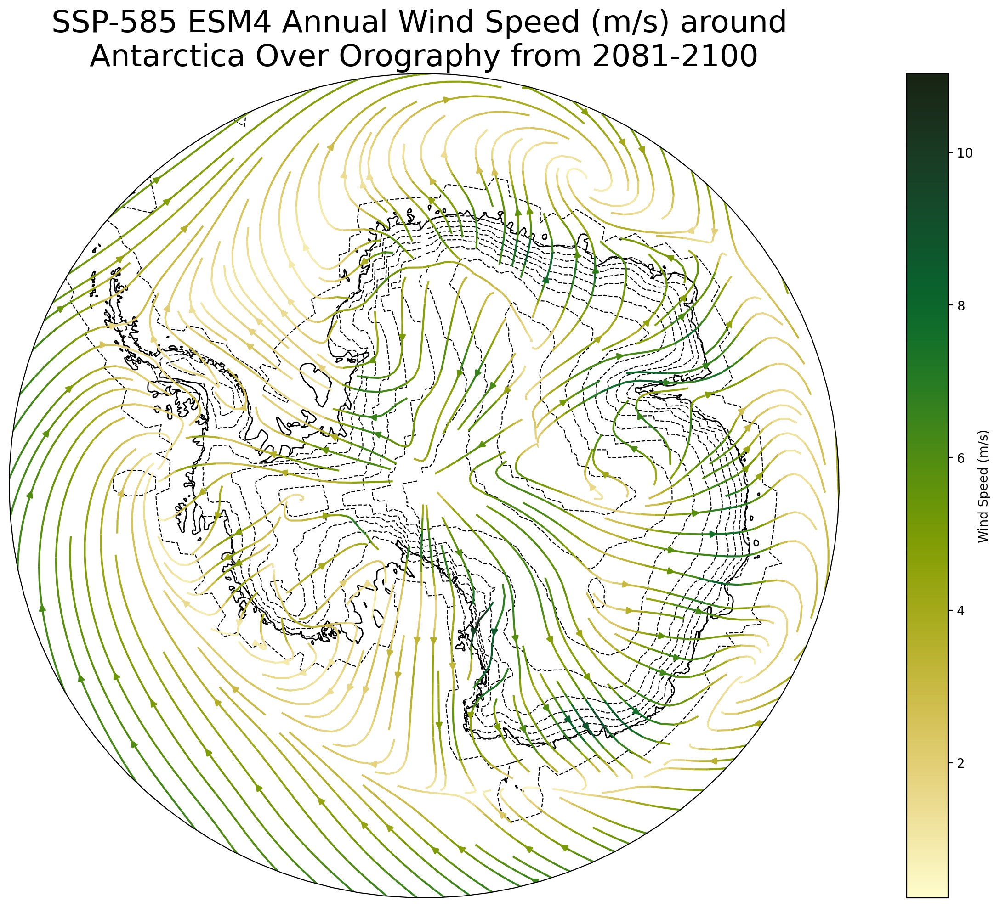

In [30]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Plotting contour of orography
esm4_ssp_orog.plot.contour(ax=ax,
                                transform=ccrs.PlateCarree(),
                                vmin=0,
                                vmax=3600,
                                extend='both',
                                colors='k',
                                levels=10,
                                linewidths=0.8,
                                linestyles='--')

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = esm4_ssp_position['lon'].values
lat = esm4_ssp_position['lat'].values
uas = esm4_ssp_position['uas'].values
vas = esm4_ssp_position['vas'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('SSP-585 ESM4 Annual Wind Speed (m/s) around \nAntarctica Over Orography from 2081-2100', fontsize=24)
plt.tight_layout()
plt.show()

---

# CM4X

## <span style="color:green">CM4X Historical</span>

### uas wind component

In [31]:
cm4x_u_his=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/historical/atmos/monthly/u_ref/*.nc')
cm4x_u_his

<xarray.Dataset>
Dimensions:     (time: 1980, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    u_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.185001-185412.u_ref.nc
    title:                 CM4_historical_c192_OM4p25
    associated_files:      area: 18540101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Sat Dec 24 23:27:31 2022
    hostname:              pp038
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### vas wind component

In [32]:
#importing northward wind output from cm4x historical simulation from backup
cm4x_v_his=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/historical/atmos/monthly/v_ref/*.nc')
cm4x_v_his

<xarray.Dataset>
Dimensions:     (time: 1980, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 1850-01-16 12:00:00 ... 2014-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    v_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.185001-185412.v_ref.nc
    title:                 CM4_historical_c192_OM4p25
    associated_files:      area: 18540101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Sat Dec 24 23:27:31 2022
    hostname:              pp038
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### merging winds

In [33]:
#slicing a 20 year period
cm4x_uas_his=cm4x_u_his.u_ref.sel(time=slice('1995-01-16','2014-12-16'))
cm4x_uas_his

<xarray.DataArray 'u_ref' (time: 240, lat: 360, lon: 576)>
dask.array<getitem, shape=(240, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      zonal wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [34]:
#slicing a 20 year period
cm4x_vas_his=cm4x_v_his.v_ref.sel(time=slice('1995-01-16','2014-12-16'))
cm4x_vas_his

<xarray.DataArray 'v_ref' (time: 240, lat: 360, lon: 576)>
dask.array<getitem, shape=(240, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 1995-01-16 12:00:00 ... 2014-12-16 12:00:00
Attributes:
    long_name:      meridional wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [35]:
cm4x_his_mergewinds = xr.merge([cm4x_uas_his,cm4x_vas_his]) # merge winds to make it easy
cm4x_his_mergewinds_xmerge = cm4x_his_mergewinds.lon #extracting the lon component fomr the mergewinds array
cm4x_his_mergewinds_ymerge = cm4x_his_mergewinds.lat
cm4x_his_mergewinds_umerge = cm4x_his_mergewinds.u_ref 
cm4x_his_mergewinds_vmerge = cm4x_his_mergewinds.v_ref
cm4x_his_speedmerge = np.sqrt(np.square(cm4x_his_mergewinds_umerge) + np.square(cm4x_his_mergewinds_vmerge)) ## calculating speed using vector formula

## position variable
cm4x_his_position= cm4x_his_mergewinds.mean(dim='time')

In [36]:
cm4x_his_position

<xarray.Dataset>
Dimensions:  (lat: 360, lon: 576)
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
Data variables:
    u_ref    (lat, lon) float32 dask.array<chunksize=(360, 576), meta=np.ndarray>
    v_ref    (lat, lon) float32 dask.array<chunksize=(360, 576), meta=np.ndarray>

### creating stream plot

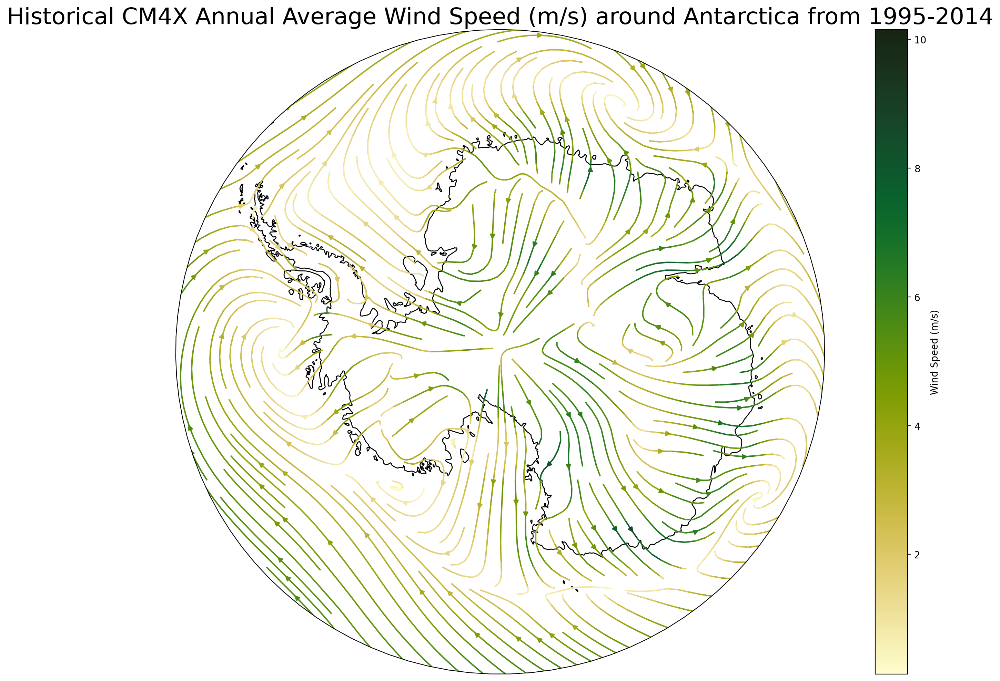

In [37]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = cm4x_his_position['lon'].values
lat = cm4x_his_position['lat'].values
uas = cm4x_his_position['u_ref'].values
vas = cm4x_his_position['v_ref'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('Historical CM4X Annual Average Wind Speed (m/s) around Antarctica from 1995-2014', fontsize=24)
plt.tight_layout()
plt.show()

---

## <span style="color:green">CM4X SSP585</span>

### uas wind component

In [38]:
cm4x_u_ssp585=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/ssp585/atmos/monthly/u_ref/*.nc')
cm4x_u_ssp585

<xarray.Dataset>
Dimensions:     (time: 1020, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 2015-01-16 12:00:00 ... 2099-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    u_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.201501-201912.u_ref.nc
    title:                 CM4_ssp585_c192_OM4p25
    associated_files:      area: 20190101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Thu Feb 16 13:17:56 2023
    hostname:              pp033
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### vas wind component

In [39]:
cm4x_v_ssp585=xr.open_mfdataset('/backup/tuq41374/model_output/cm4x/p25/ssp585/atmos/monthly/v_ref/*.nc')
cm4x_v_ssp585

<xarray.Dataset>
Dimensions:     (time: 1020, bnds: 2, lat: 360, lon: 576)
Coordinates:
  * bnds        (bnds) float64 1.0 2.0
  * lat         (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon         (lon) float64 0.3125 0.9375 1.562 2.188 ... 358.4 359.1 359.7
  * time        (time) object 2015-01-16 12:00:00 ... 2099-12-16 12:00:00
Data variables:
    average_DT  (time) timedelta64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T1  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    average_T2  (time) datetime64[ns] dask.array<chunksize=(60,), meta=np.ndarray>
    lat_bnds    (time, lat, bnds) float64 dask.array<chunksize=(60, 360, 2), meta=np.ndarray>
    lon_bnds    (time, lon, bnds) float64 dask.array<chunksize=(60, 576, 2), meta=np.ndarray>
    time_bnds   (time, bnds) object dask.array<chunksize=(60, 2), meta=np.ndarray>
    v_ref       (time, lat, lon) float32 dask.array<chunksize=(60, 360, 576), meta=np.ndarray>
Attributes:
    filename:              atmos.201501-201912.v_ref.nc
    title:                 CM4_ssp585_c192_OM4p25
    associated_files:      area: 20190101.grid_spec.nc
    grid_type:             regular
    grid_tile:             N/A
    code_release_version:  19.1
    git_hash:              c97c1f6afab0df3545ee82c337d51accc4205bc3
    creationtime:          Thu Feb 16 13:17:56 2023
    hostname:              pp033
    history:               fregrid --standard_dimension --input_mosaic C192_m...

### merging winds

In [40]:
#slicing a 20 year period
cm4x_uas_ssp585=cm4x_u_ssp585.u_ref.sel(time=slice('2081-01-16','2100-12-16'))
cm4x_uas_ssp585

<xarray.DataArray 'u_ref' (time: 228, lat: 360, lon: 576)>
dask.array<getitem, shape=(228, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 2081-01-16 12:00:00 ... 2099-12-16 12:00:00
Attributes:
    long_name:      zonal wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [41]:
#slicing a 20 year period
cm4x_vas_ssp585=cm4x_v_ssp585.v_ref.sel(time=slice('2081-01-16','2100-12-16'))
cm4x_vas_ssp585

<xarray.DataArray 'v_ref' (time: 228, lat: 360, lon: 576)>
dask.array<getitem, shape=(228, 360, 576), dtype=float32, chunksize=(60, 360, 576), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float64 -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
  * lon      (lon) float64 0.3125 0.9375 1.562 2.188 ... 357.8 358.4 359.1 359.7
  * time     (time) object 2081-01-16 12:00:00 ... 2099-12-16 12:00:00
Attributes:
    long_name:      meridional wind component at 10 m
    units:          m/s
    valid_range:    [-400.  400.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    interp_method:  conserve_order2

In [42]:
cm4x_ssp585_mergewinds = xr.merge([cm4x_uas_ssp585,cm4x_vas_ssp585]) # merge winds to make it easy
cm4x_ssp585_mergewinds_xmerge = cm4x_ssp585_mergewinds.lon #extracting the lon component fomr the mergewinds array
cm4x_ssp585_mergewinds_ymerge = cm4x_ssp585_mergewinds.lat
cm4x_ssp585_mergewinds_umerge = cm4x_ssp585_mergewinds.u_ref 
cm4x_ssp585_mergewinds_vmerge = cm4x_ssp585_mergewinds.v_ref

## position variable
cm4x_ssp585_position= cm4x_ssp585_mergewinds.mean(dim='time')

### creating stream plot

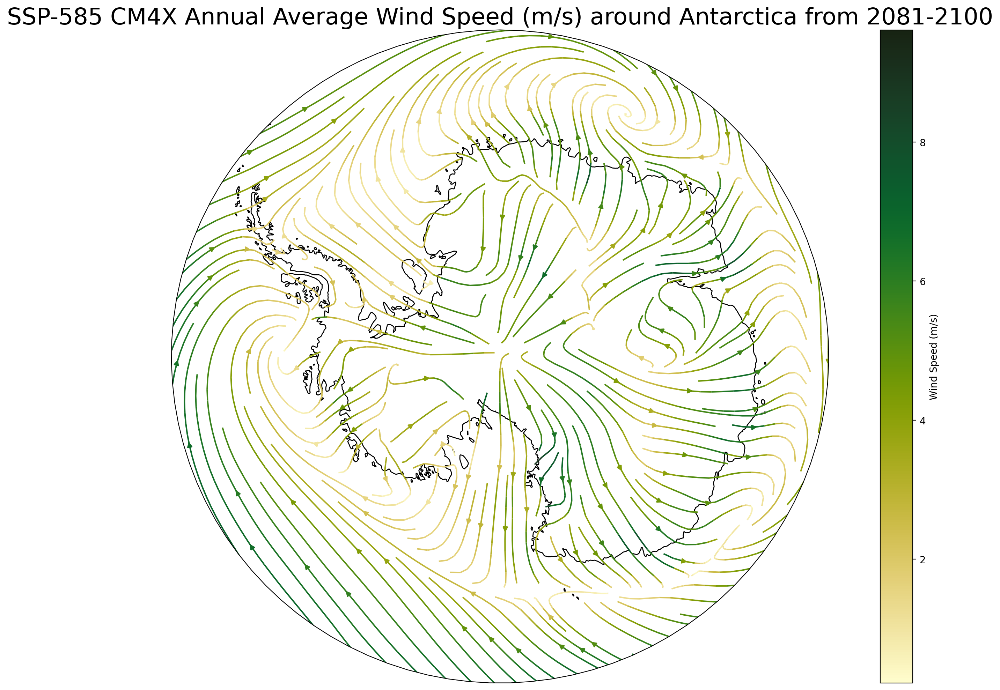

In [52]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = cm4x_ssp585_position['lon'].values
lat = cm4x_ssp585_position['lat'].values
uas = cm4x_ssp585_position['u_ref'].values
vas = cm4x_ssp585_position['v_ref'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('SSP-585 CM4X Annual Average Wind Speed (m/s) around Antarctica from 2081-2100', fontsize=24)
plt.tight_layout()
plt.show()

---

# ERA5

In [15]:
#orography
era5_drive_orog=xr.open_dataset('/backup/tuq41374/observations/reanalysis/ERA5/era5_orography_1940_monthly_ensemble.nc')
era5_orog=era5_drive_orog.z.mean(dim='time').mean(dim='number')
era5_orog

<xarray.DataArray 'z' (latitude: 361, longitude: 720)>
array([[ 1.25937500e+01,  1.25937500e+01,  1.25937500e+01, ...,
         1.25937500e+01,  1.25937500e+01,  1.25937500e+01],
       [-1.81054688e+00, -2.65820312e+00, -2.65820312e+00, ...,
        -9.62890625e-01, -9.62890625e-01, -1.81054688e+00],
       [-1.53671875e+01, -1.53671875e+01, -1.62148438e+01, ...,
        -1.36718750e+01, -1.45195312e+01, -1.53671875e+01],
       ...,
       [ 2.64758281e+04,  2.64859961e+04,  2.65004023e+04, ...,
         2.64436289e+04,  2.64538008e+04,  2.64648164e+04],
       [ 2.69477656e+04,  2.69553906e+04,  2.69621680e+04, ...,
         2.69308164e+04,  2.69367539e+04,  2.69418398e+04],
       [ 2.72104258e+04,  2.72104258e+04,  2.72104258e+04, ...,
         2.72104258e+04,  2.72104258e+04,  2.72104258e+04]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0

In [19]:
orog_data=xr.open_dataset('/backup/tuq41374/observations/reanalysis/ERA5/era5_orography_1940_monthly_ensemble.nc')
orog=orog_data.z.isel(time=0,number=0)/9.8

land_sea_mask= xr.open_dataset('/home/pachamama/shared/era5_land_sea_mask_1940_monthly_ensemble.nc')

orog_lsm = orog*(land_sea_mask.lsm.isel(time=0,number=0).where (land_sea_mask.lsm.isel(time=0,number=0)>0))

era5_static_oceanNAN= land_sea_mask.lsm.where(orog>0).mean('number').mean('time')
era5_elevation= (era5_static_oceanNAN * land_sea_mask.lsm).mean('number').mean('time')

era5_orog= era5_elevation*orog

In [6]:
ERA5_uas_data=xr.open_mfdataset('/home/pachamama/shared/era5_10m_u_component_of_wind_1940-2024_monthly_ensemble.nc',use_cftime=True)
ERA5_vas_data=xr.open_mfdataset('/home/pachamama/shared/era5_10m_v_component_of_wind_1940-2024_monthly_ensemble.nc',use_cftime=True)

### uas wind component

In [7]:
era_uas_no_leap=ERA5_uas_data.assign_attrs(calendar='noleap')
ERA5_uas_95_2014=era_uas_no_leap.u10.mean(dim='number').mean(dim='expver').sel(time=slice('1995-01-01','2014-12-01'))
ERA5_uas_95_2014

<xarray.DataArray 'u10' (time: 240, latitude: 361, longitude: 720)>
dask.array<getitem, shape=(240, 361, 720), dtype=float32, chunksize=(240, 361, 720), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * time       (time) object 1995-01-01 00:00:00 ... 2014-12-01 00:00:00

### vas wind component

In [8]:
era_vas_no_leap=ERA5_vas_data.assign_attrs(calendar='noleap')
ERA5_vas_95_2014=era_vas_no_leap.v10.mean(dim='number').mean(dim='expver').sel(time=slice('1995-01-01','2014-12-01'))
ERA5_vas_95_2014

<xarray.DataArray 'v10' (time: 240, latitude: 361, longitude: 720)>
dask.array<getitem, shape=(240, 361, 720), dtype=float32, chunksize=(240, 361, 720), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * time       (time) object 1995-01-01 00:00:00 ... 2014-12-01 00:00:00

### merging winds

In [9]:
ERA5_merge_winds=xr.merge([ERA5_vas_95_2014,ERA5_uas_95_2014])
xmerge = ERA5_merge_winds.longitude #extracting the lon component fomr the mergewinds array
ymerge = ERA5_merge_winds.latitude
umerge = ERA5_merge_winds.u10
vmerge = ERA5_merge_winds.v10
era5_speedmerge = np.sqrt(np.square(umerge) + np.square(vmerge)) ## calculating speed using vector sum formula

## speed / magnitude 
era5_speedslice=era5_speedmerge.mean(dim='time')

## position of vectors
era5_position = ERA5_merge_winds.mean(dim='time')
era5_position

<xarray.Dataset>
Dimensions:    (longitude: 720, latitude: 361)
Coordinates:
  * longitude  (longitude) float32 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * latitude   (latitude) float32 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
Data variables:
    v10        (latitude, longitude) float32 dask.array<chunksize=(361, 720), meta=np.ndarray>
    u10        (latitude, longitude) float32 dask.array<chunksize=(361, 720), meta=np.ndarray>

### creating stream plot

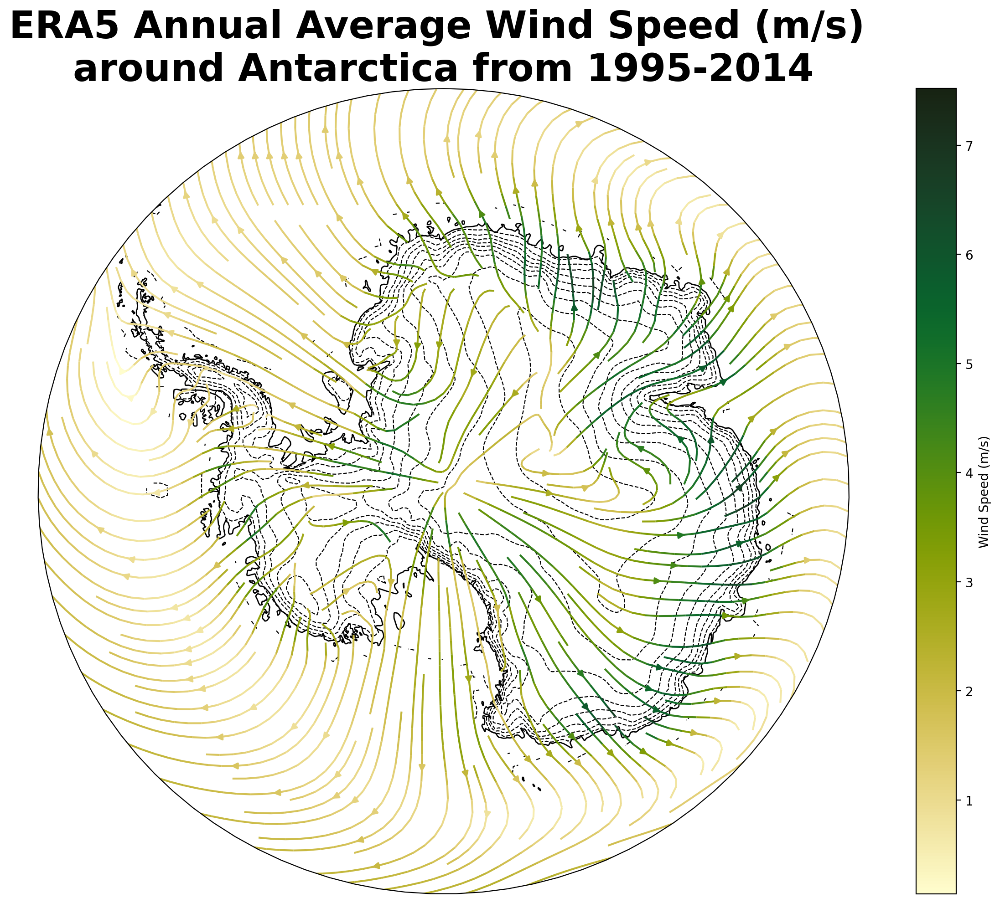

In [20]:
subplot_kws = dict(projection=ccrs.SouthPolarStereo())
fig, ax = plt.subplots(figsize=[15,10], subplot_kw=subplot_kws)

# Limit the map to -50 degrees latitude and below
ax.set_extent([-180, 180, -90, -60], ccrs.PlateCarree())

# Plotting contour of orography
era5_orog.plot.contour(ax=ax,
                                transform=ccrs.PlateCarree(),
                                vmin=0,
                                vmax=3600,
                                extend='both',
                                colors='k',
                                levels=10,
                                linewidths=0.8,
                                linestyles='--')

# Create a circular boundary around the plot
theta = np.linspace(0, 2 * np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
ax.coastlines()

# Extract data for streamplot
lon = era5_position['longitude'].values
lat = era5_position['latitude'].values
uas = era5_position['u10'].values
vas = era5_position['v10'].values

# Calculate the speed for colormap
speed = np.sqrt(uas**2 + vas**2)

# Create the streamplot with a colormap
strm = ax.streamplot(lon, lat, uas, vas, color=speed, cmap=cmocean.cm.speed,
                     transform=ccrs.PlateCarree(), density=2)

# Add a colorbar
cbar = plt.colorbar(strm.lines, ax=ax, orientation='vertical', pad=0.05)
cbar.set_label('Wind Speed (m/s)')

plt.title('ERA5 Annual Average Wind Speed (m/s) \naround Antarctica from 1995-2014', fontsize=30,fontweight='bold')
plt.tight_layout()
plt.show()

---